In [201]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def load_and_preprocess_image(image_path, closing_kernel = np.array([[0,0,0,0,0],[0,1,1,1,0],[1,1,1,1,1],[0,1,1,1,0],[0,0,1,0,0]],np.uint8)):

    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    binary_image = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)
   
    closing_kernel= closing_kernel
    processed_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, closing_kernel, iterations=3)

    dilation_kernel = np.ones((2, 2), np.uint8)
    processed_image = cv2.dilate(processed_image, dilation_kernel, iterations=1)

    return image, processed_image


def draw_bounding_boxes(image, bounding_boxes, color=(0, 255, 0), thickness=2):

    output_image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    
    for (x, y, w, h) in bounding_boxes:
        cv2.rectangle(output_image, (x, y), (x + w, y + h), color, thickness)
    
    return output_image

def display_image(image, title="Optimized Character Segmentation"):
 
    plt.figure(figsize=(10, 10))
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.title(title)
    plt.show()



In [ ]:
def split_large_boxes(processed_image, stats, original_image, width_threshold=1.26, height_threshold=1.3):
  
    new_boxes = [] 
    stats_len = len(stats)
    all_widths = [stats[i][2] for i in range(0,stats_len)]
   # print(all_widths)
    all_heights = [stats[i][3] for i in range(0,stats_len)]
    all_area = [stats[i][4] for i in range(0,stats_len)]
    avg_width = np.mean(all_widths) if all_widths else 20
    #print(avg_width)
    avg_height = np.mean(all_heights) if all_heights else 30
    #print(avg_height)
    avg_area = np.mean(all_area) if all_area else 100
    #print(avg_area)
    for x, y, w, h, area in stats:
        aspect_ratio_width = w / h
        aspect_ratio_height = h / w
       
        if aspect_ratio_width > width_threshold and w > 1.26*avg_width and area > 1.55*avg_area: 
            print(area) 
            refined_boxes = refine_extreme_aspect_boxes(original_image, x,y,w,h, avg_height,avg_width, vertical =False)
            print(refined_boxes)
            for x,y,w,h in refined_boxes:
                new_boxes.append((x,y,w,h))
        elif aspect_ratio_height > height_threshold and h > 1.26* avg_height and area > 1.6* avg_area:  
            refined_boxes = refine_extreme_aspect_boxes(original_image, x,y,w,h, avg_height,avg_width,vertical=True)
            print(refined_boxes)
            for x,y,w,h in refined_boxes:
                new_boxes.append((x,y,w,h))
        else:
            new_boxes.append((x, y, w, h))
      
        #new_boxes.append((x,y,w,h))
   # print(new_boxes)

    return new_boxes

def refine_extreme_aspect_boxes(image, x,y,w,h, avg_height, avg_width, closing_kernel_size=(5,3), tolerance_ratio=0.5, vertical = False, iteration = 2):
    closing_kernel = np.array([[0,1,0],[0,1,0],[0,1,1],[1,1,1],[1,1,1],[0,1,0],[0,1,0]],np.uint8)
    #closing_kernel = np.array([[0,1,0],[0,1,0],[1,1,0],[1,1,1],[1,1,1],[0,1,0]],np.uint8)

    connectivity = 8
    if vertical:
        closing_kernel_size = (2,3)
        closing_kernel = np.ones(closing_kernel_size, np.uint8)
        iteration = 2
        connectivity = 8
    refined_boxes = []
    image = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)
            # Extract the region of interest (ROI) from the original image
    boxed_region = image[y:y+h, x:x+w]
    boxed_img = draw_bounding_boxes(image,[(x,y,w,h)])
    display_image(boxed_img)

            # Apply threshold and smaller morphological closing to this ROI
          
    
    boxed_region_closed = cv2.morphologyEx(boxed_region, cv2.MORPH_CLOSE, closing_kernel, iterations=iteration)
    
   

            # Detect connected components in the ROI
    num, _, stats, _ = cv2.connectedComponentsWithStats(boxed_region_closed, connectivity)

    best_local_box = None
    for i in range(1, num):
        lx, ly, lw, lh, larea = stats[i]
        if lw < 0.5*avg_width or lh < 0.5*avg_height:
            continue
                # Check if the box is close to the average dimensions
        if (abs(lw - avg_width) / avg_width < tolerance_ratio and
            abs(lh - avg_height) / avg_height < tolerance_ratio):
            best_local_box = (x + lx, y + ly, lw, lh)
        if best_local_box:
            #print(f"best_local_box:{best_local_box}")
            refined_boxes.append(best_local_box)
            
    

        # Default: keep the original
    if not refined_boxes:
        refined_boxes.append((x, y, w, h))
    boxed_img = draw_bounding_boxes(image,refined_boxes)
    display_image(boxed_img, title=f"{refined_boxes}")
     
    return refined_boxes
def detect_large_characters(processed_image, original_image, min_area=50, max_area=5000, dynamic_factor=0.45, padding_ratio=0.1):
   
    num_labels, labels, stats, centboxed_regionds = cv2.connectedComponentsWithStats(processed_image, connectivity=8)
    w_thresh = 10
    h_thresh = 10
    img_h, img_w = processed_image.shape
    large_char_stats= []
    for x, y, w, h, area in stats:
        if (w > w_thresh and h >= h_thresh):
            large_char_stats.append((x, y, w, h, area))
    large_char_num = len(large_char_stats)
    all_widths = [large_char_stats[i][2] for i in range(1, large_char_num)]
    all_heights = [large_char_stats[i][3] for i in range(1, large_char_num)]
    all_areas = [large_char_stats[i][4] for i in range(1, large_char_num)]
    avg_area = np.mean(all_areas) if all_widths else 600
    avg_width = np.mean(all_widths) if all_widths else 20
    avg_height = np.mean(all_heights) if all_heights else 30

    min_width = max(15, int(avg_width * dynamic_factor))
    max_width = int(avg_width * 2.5)
    min_height = max(15, int(avg_height * dynamic_factor))
    max_height = int(avg_height * 2.8)
    max_area = int(avg_area * 3)

    bounding_boxes = []
    for i in range(1, large_char_num):  
        x, y, w, h, area = large_char_stats[i]

        if min_area < area < max_area and min_width < w < max_width and min_height < h < max_height:
            bounding_boxes.append((x, y, w, h, area))

    refined_boxes = split_large_boxes(processed_image, bounding_boxes, original_image)

    final_boxes = []
    for x, y, w, h in refined_boxes:
        padding_w = int(w * padding_ratio)
        padding_h = int(h * padding_ratio)

        x_new = max(0, x - padding_w)
        y_new = max(0, y - padding_h)
        w_new = min(img_w - x_new, w + 2 * padding_w)
        h_new = min(img_h - y_new, h + 2 * padding_h)

        final_boxes.append((x_new, y_new, w_new, h_new))
    
    return final_boxes


In [ ]:
import os
def save_image(image, input_path, output_folder):
    """saves image"""
    filename = os.path.basename(input_path) 
    output_path = os.path.join(output_folder, filename) 
    os.makedirs(output_folder, exist_ok=True) 
    #save without compression
    cv2.imwrite(output_path, image, [cv2.IMWRITE_PNG_COMPRESSION, 0])

    return output_path 
def process_all_images(input_root_folder, output_root_folder):
    """process with all images"""
    for root, _, files in os.walk(input_root_folder):
        # determine output directory
        relative_path = os.path.relpath(root, input_root_folder)
        output_folder = os.path.join(output_root_folder, relative_path)
         #ensures the path exists
        os.makedirs(output_folder, exist_ok=True) 

        png_files = [file for file in files if file.lower().endswith(".png")]       
        if not png_files:
            print(f"No PNG images found in {root}")
            continue
        
        for file in png_files:
            input_image_path = os.path.join(root, file)
            print(input_image_path)
            # load and process
            original_image, processed_image = load_and_preprocess_image(input_image_path)
            character_boxes = detect_large_characters(processed_image)
            output_image_segmented = draw_bounding_boxes(original_image, character_boxes)
            save_image(output_image_segmented, input_image_path, output_folder)
           # print(f"Processed: {input_image_path}")

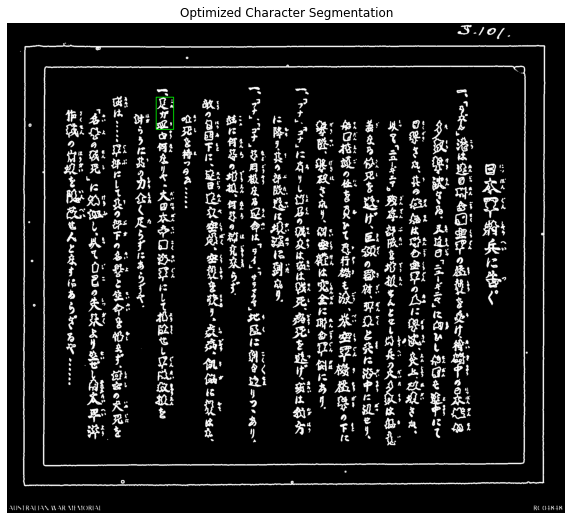

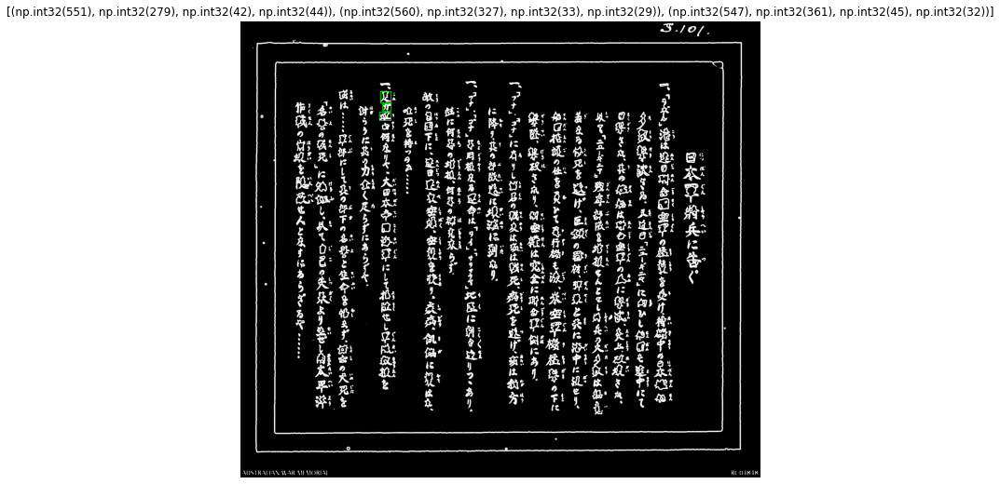

[(np.int32(551), np.int32(279), np.int32(42), np.int32(44)), (np.int32(560), np.int32(327), np.int32(33), np.int32(29)), (np.int32(547), np.int32(361), np.int32(45), np.int32(32))]


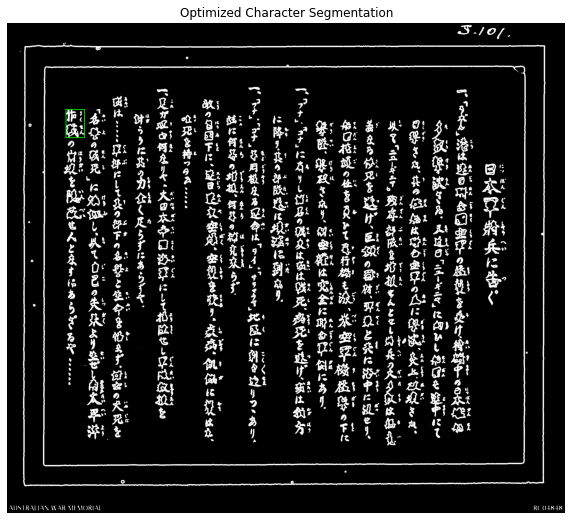

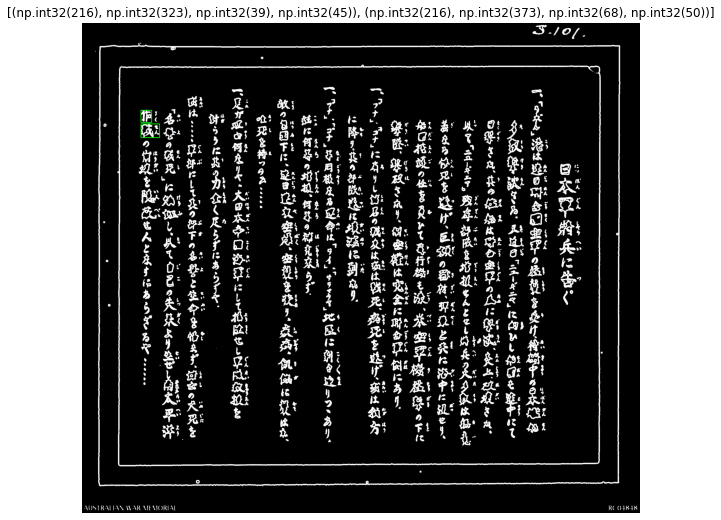

[(np.int32(216), np.int32(323), np.int32(39), np.int32(45)), (np.int32(216), np.int32(373), np.int32(68), np.int32(50))]


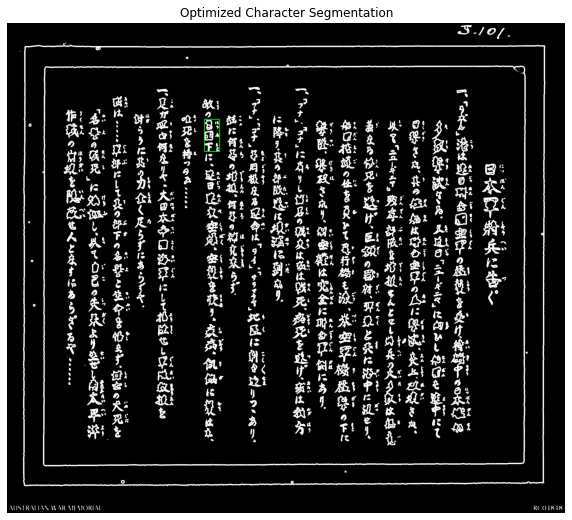

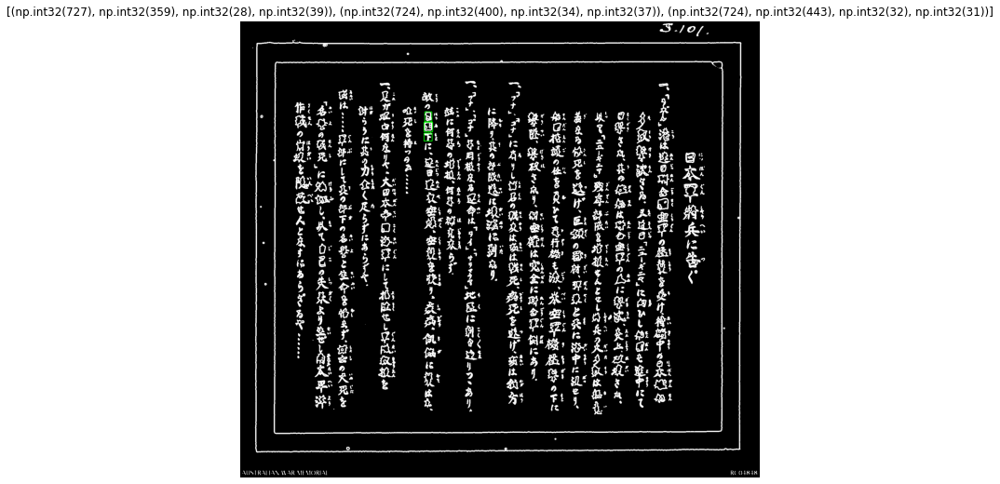

[(np.int32(727), np.int32(359), np.int32(28), np.int32(39)), (np.int32(724), np.int32(400), np.int32(34), np.int32(37)), (np.int32(724), np.int32(443), np.int32(32), np.int32(31))]


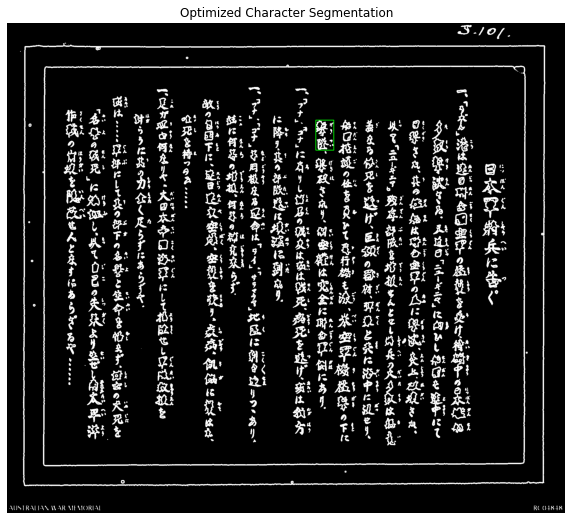

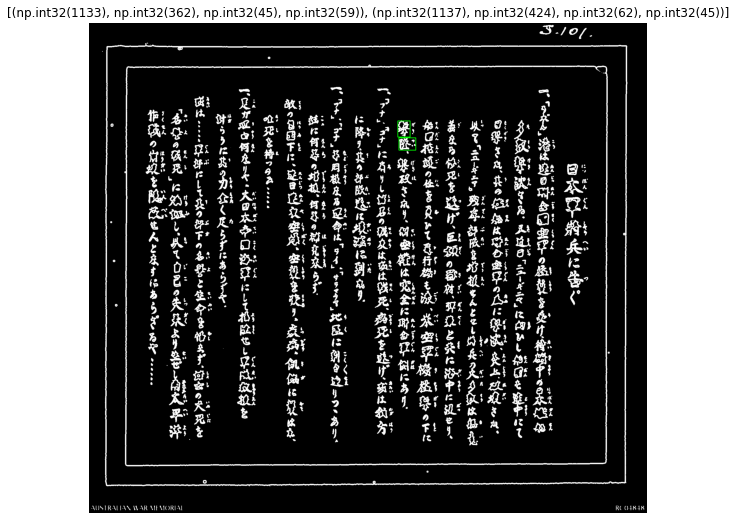

[(np.int32(1133), np.int32(362), np.int32(45), np.int32(59)), (np.int32(1137), np.int32(424), np.int32(62), np.int32(45))]


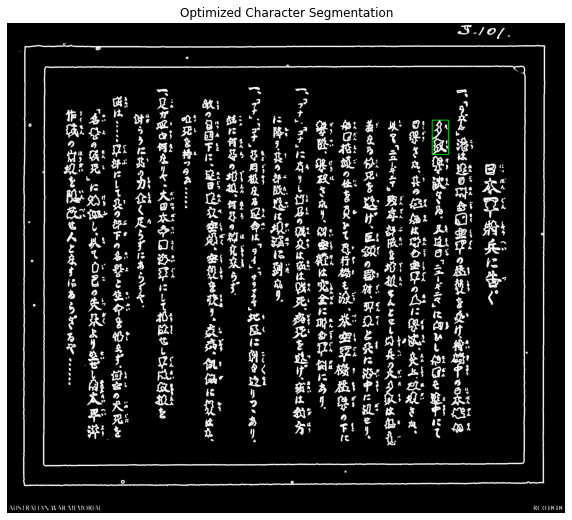

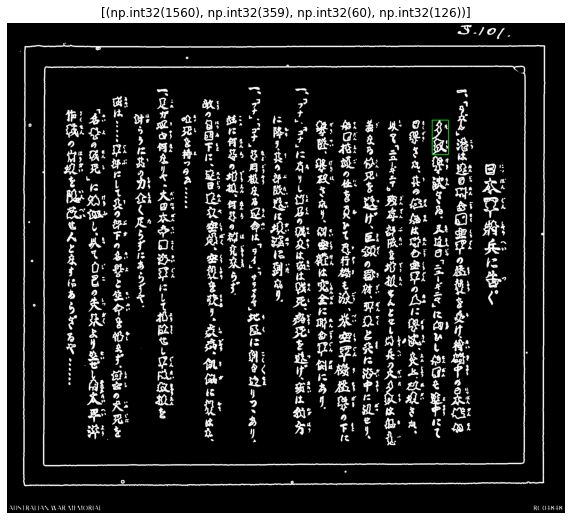

[(np.int32(1560), np.int32(359), np.int32(60), np.int32(126))]


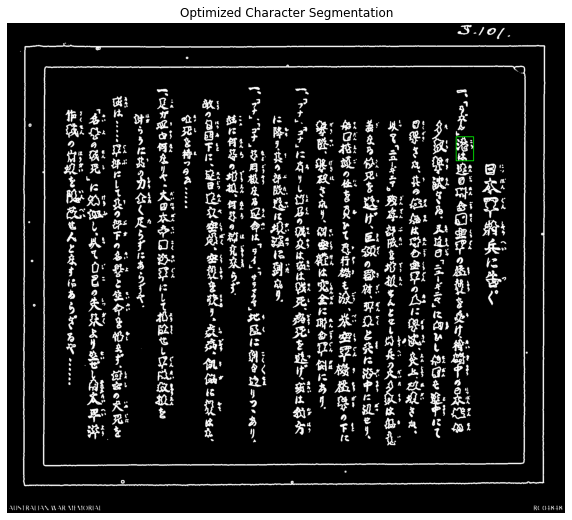

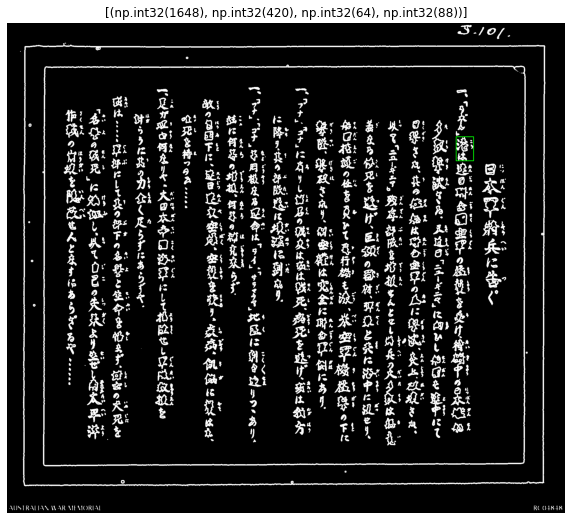

[(np.int32(1648), np.int32(420), np.int32(64), np.int32(88))]


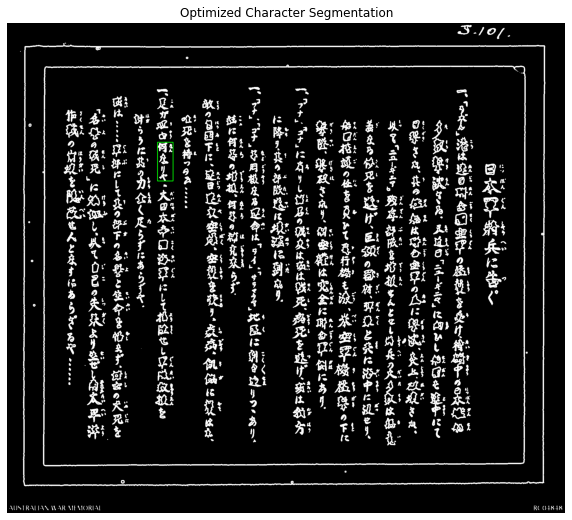

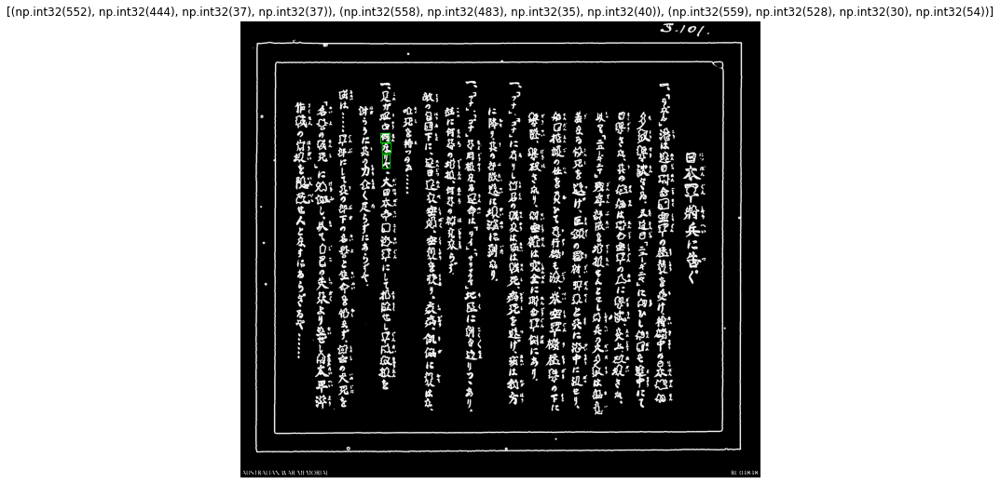

[(np.int32(552), np.int32(444), np.int32(37), np.int32(37)), (np.int32(558), np.int32(483), np.int32(35), np.int32(40)), (np.int32(559), np.int32(528), np.int32(30), np.int32(54))]


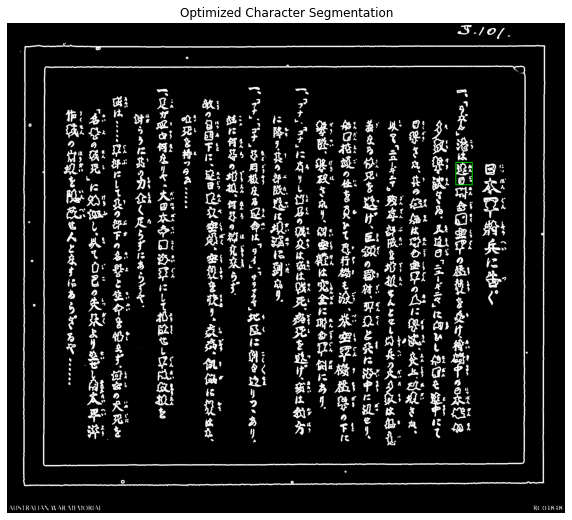

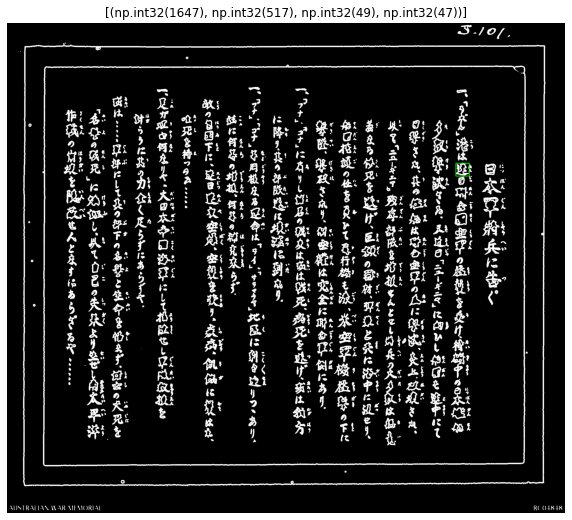

[(np.int32(1647), np.int32(517), np.int32(49), np.int32(47))]


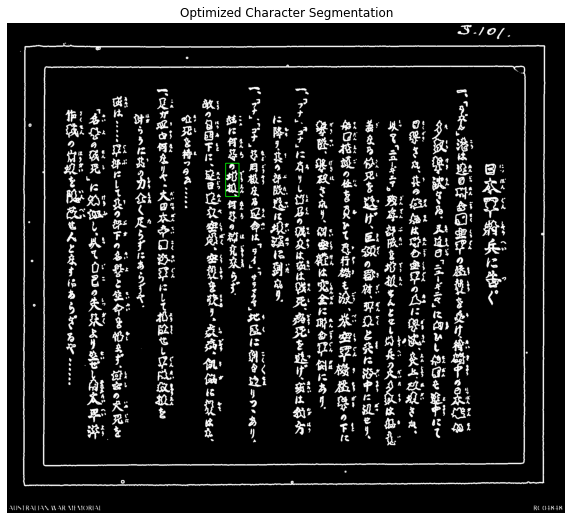

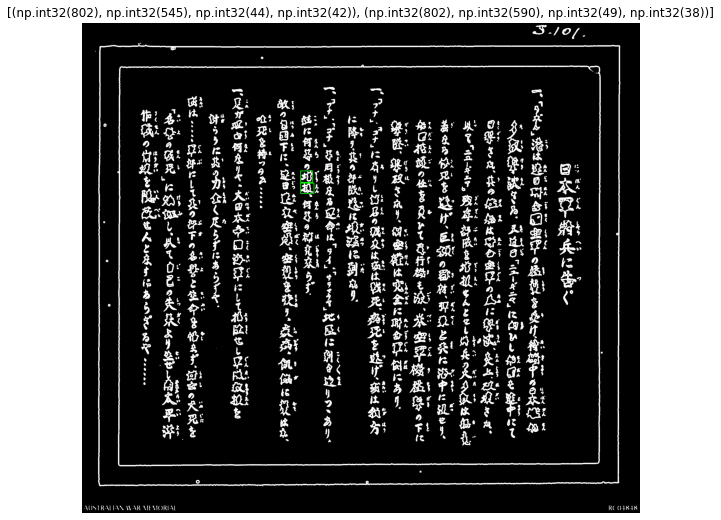

[(np.int32(802), np.int32(545), np.int32(44), np.int32(42)), (np.int32(802), np.int32(590), np.int32(49), np.int32(38))]


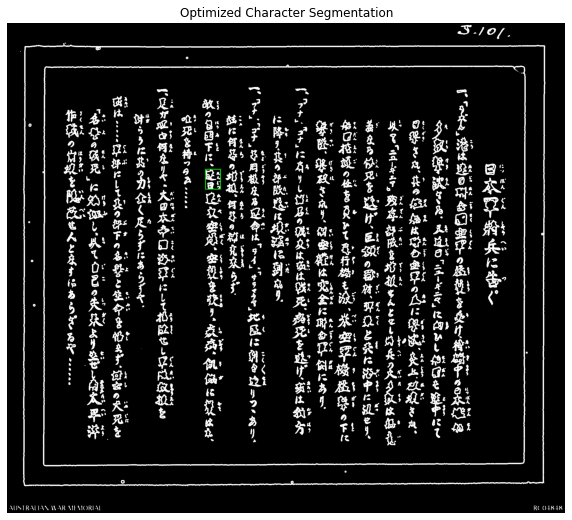

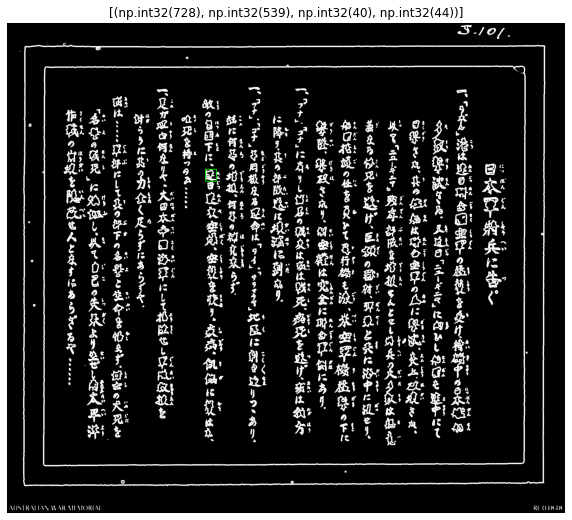

[(np.int32(728), np.int32(539), np.int32(40), np.int32(44))]


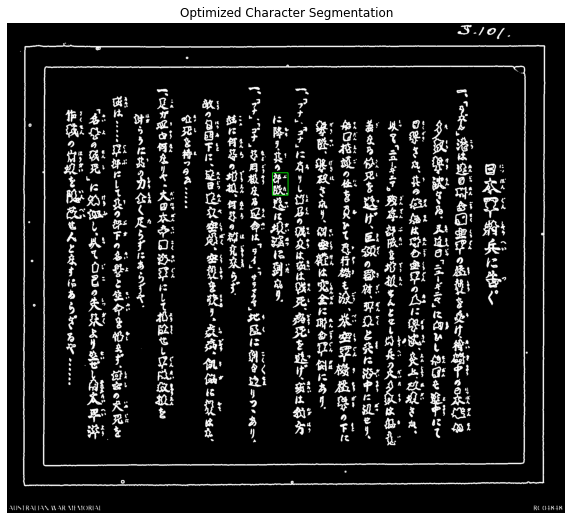

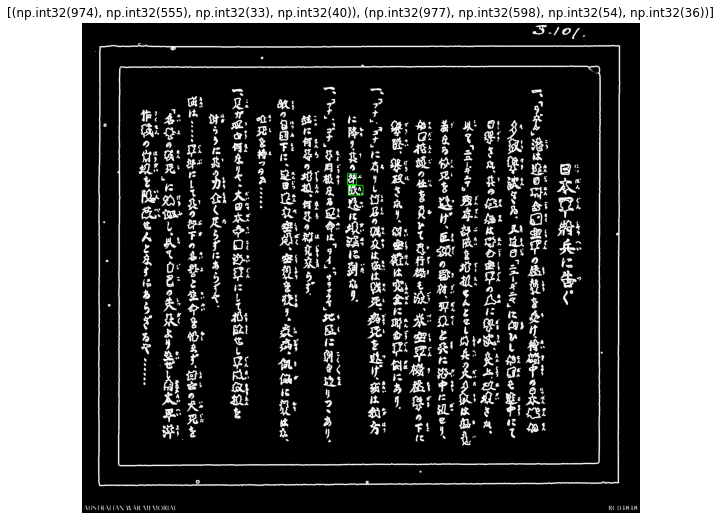

[(np.int32(974), np.int32(555), np.int32(33), np.int32(40)), (np.int32(977), np.int32(598), np.int32(54), np.int32(36))]


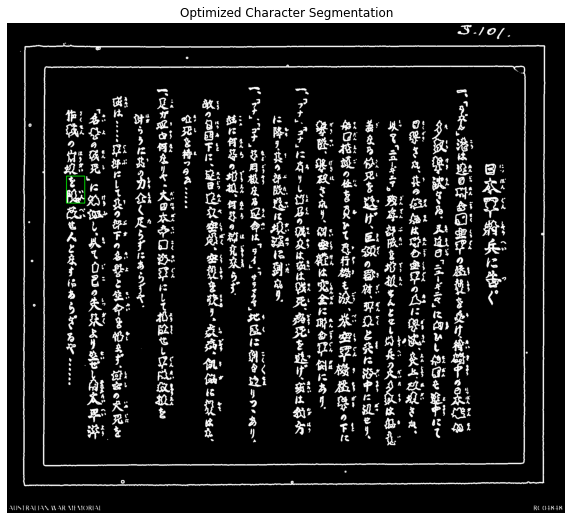

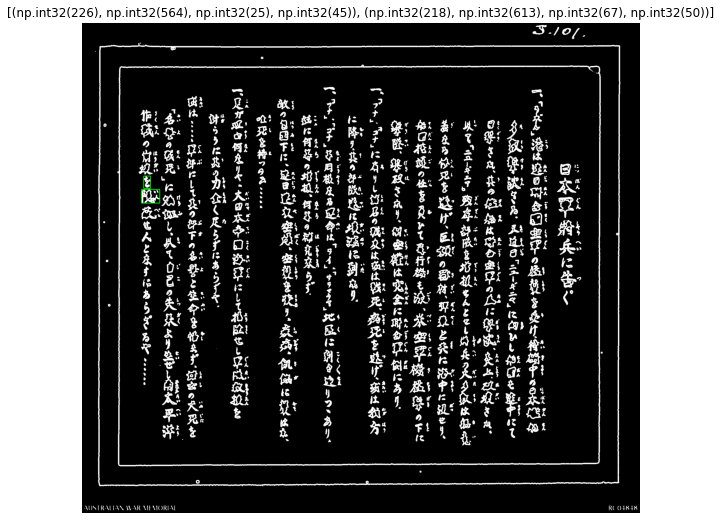

[(np.int32(226), np.int32(564), np.int32(25), np.int32(45)), (np.int32(218), np.int32(613), np.int32(67), np.int32(50))]


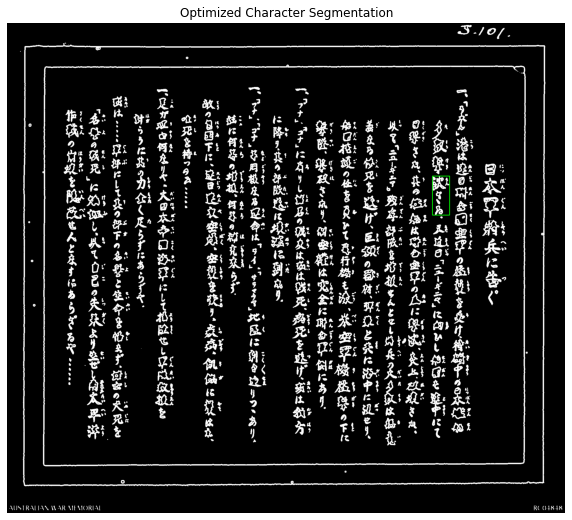

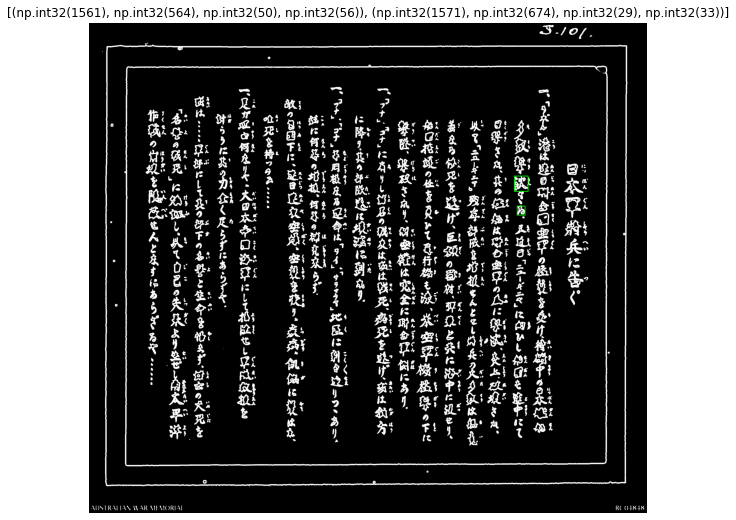

[(np.int32(1561), np.int32(564), np.int32(50), np.int32(56)), (np.int32(1571), np.int32(674), np.int32(29), np.int32(33))]


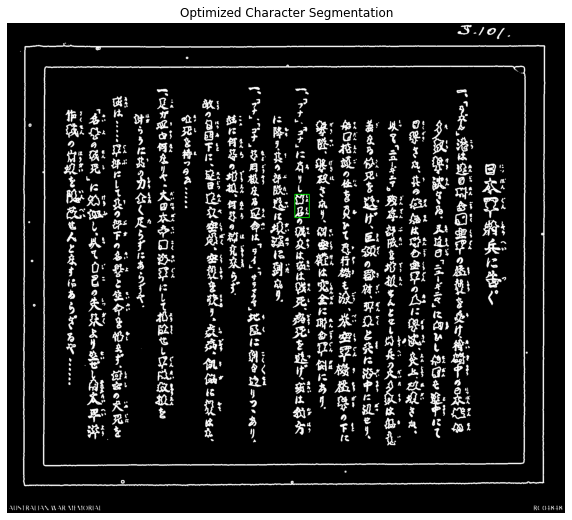

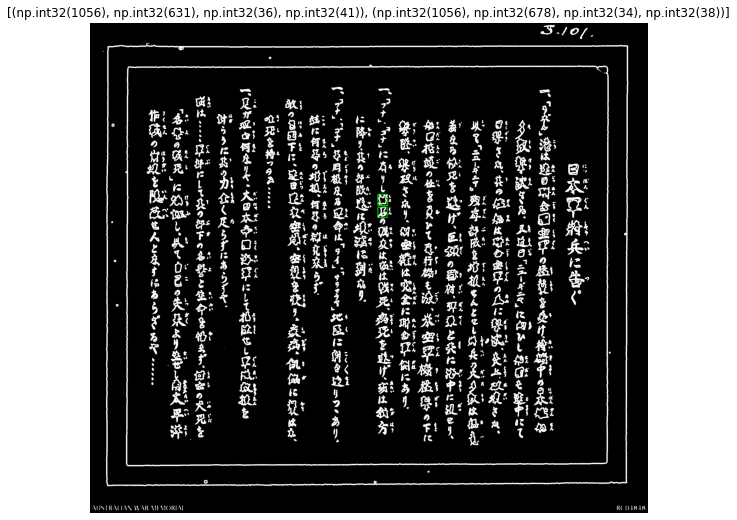

[(np.int32(1056), np.int32(631), np.int32(36), np.int32(41)), (np.int32(1056), np.int32(678), np.int32(34), np.int32(38))]


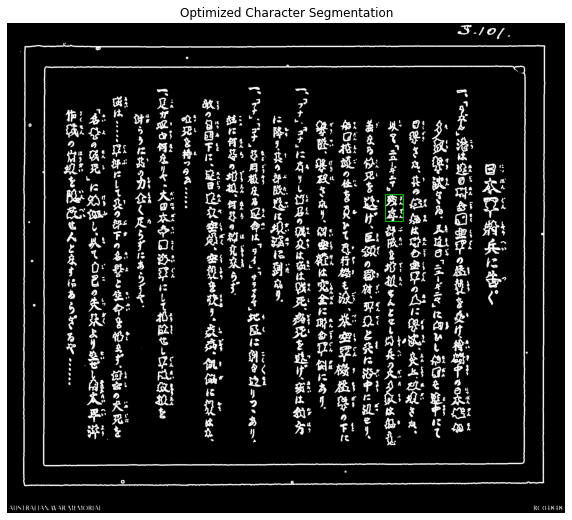

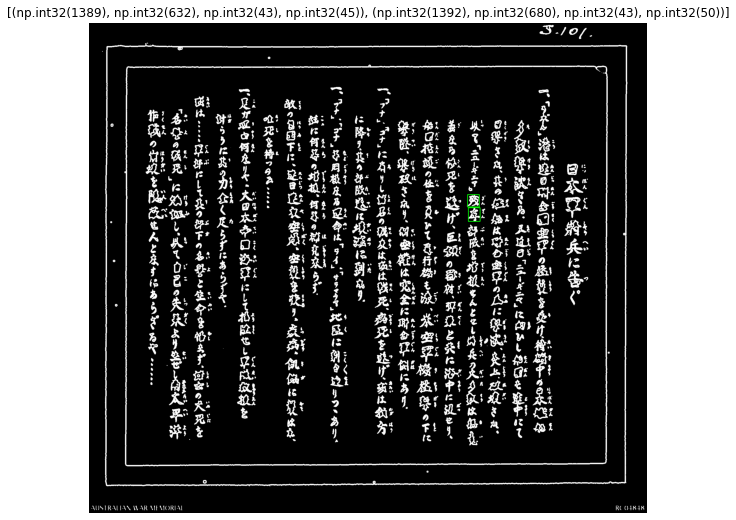

[(np.int32(1389), np.int32(632), np.int32(43), np.int32(45)), (np.int32(1392), np.int32(680), np.int32(43), np.int32(50))]


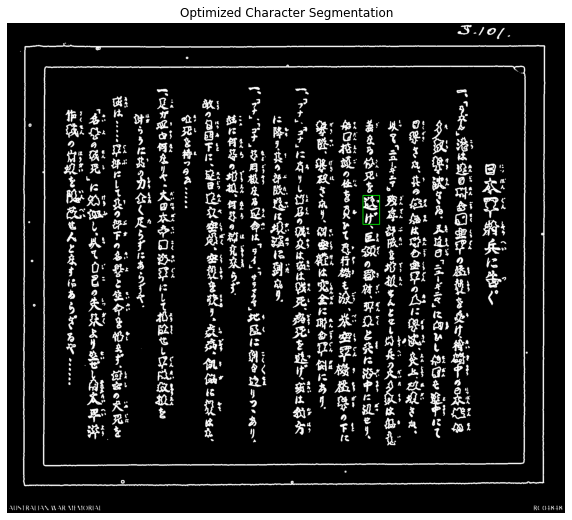

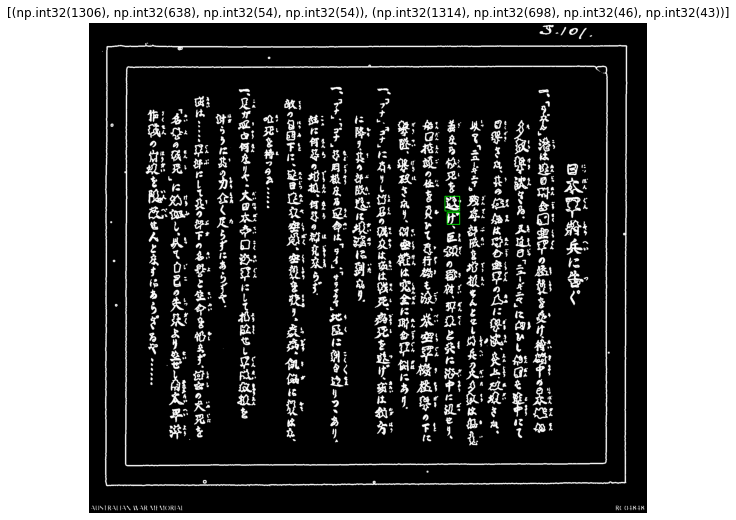

[(np.int32(1306), np.int32(638), np.int32(54), np.int32(54)), (np.int32(1314), np.int32(698), np.int32(46), np.int32(43))]


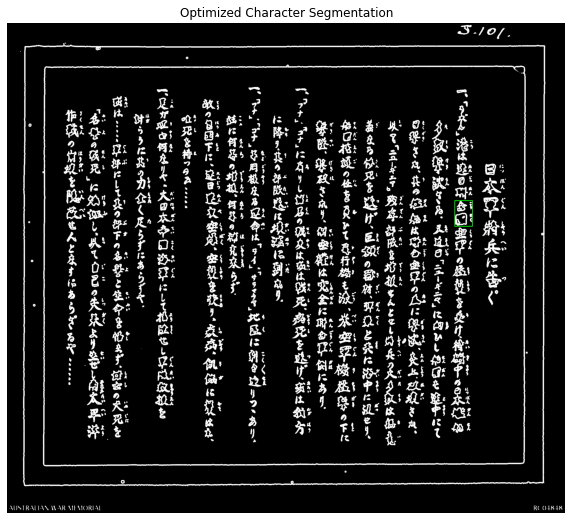

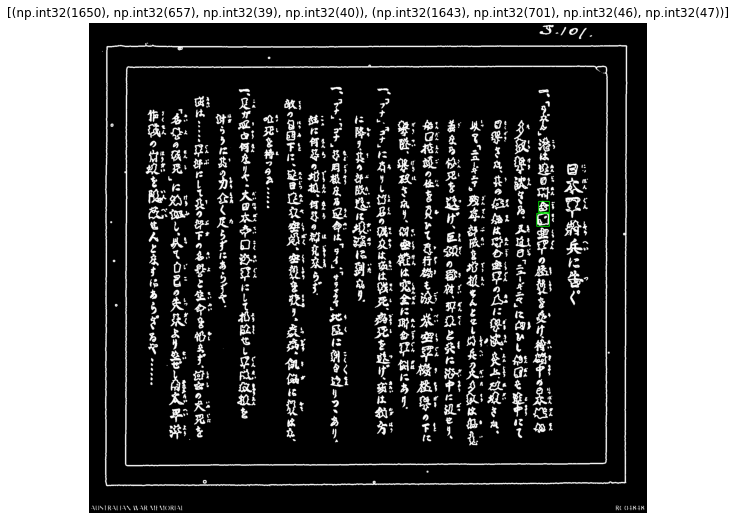

[(np.int32(1650), np.int32(657), np.int32(39), np.int32(40)), (np.int32(1643), np.int32(701), np.int32(46), np.int32(47))]
2883


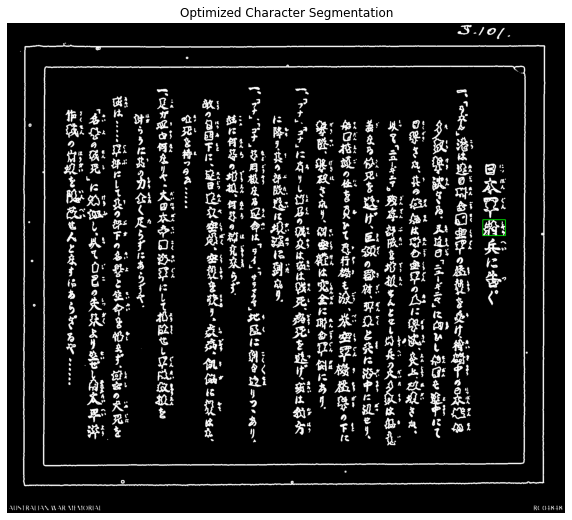

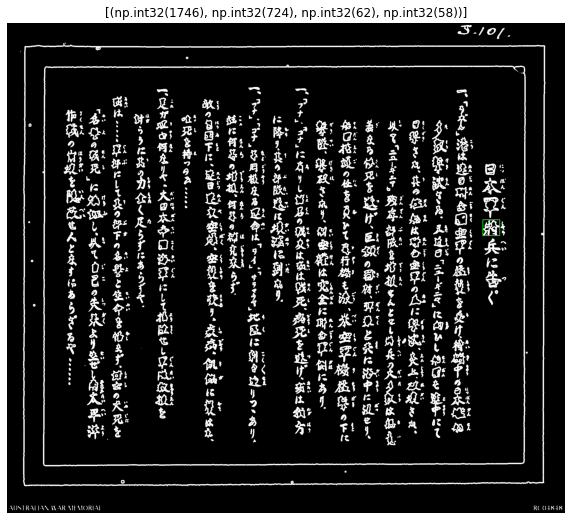

[(np.int32(1746), np.int32(724), np.int32(62), np.int32(58))]


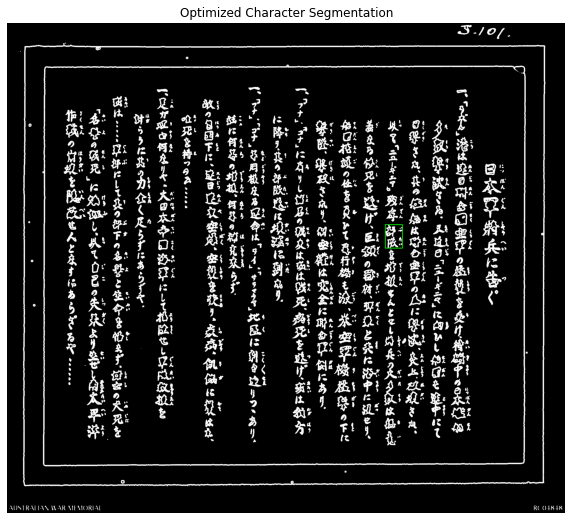

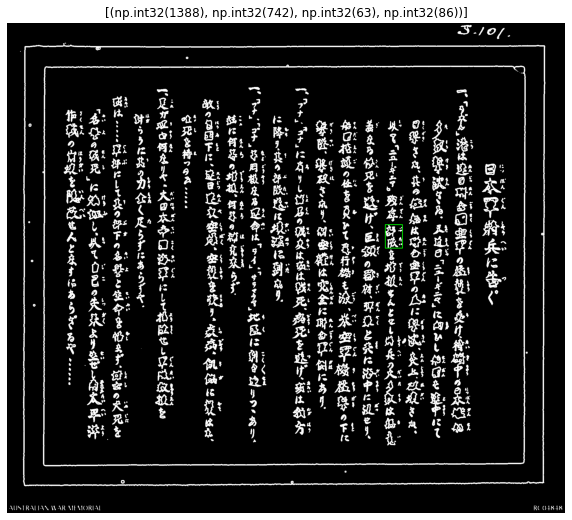

[(np.int32(1388), np.int32(742), np.int32(63), np.int32(86))]


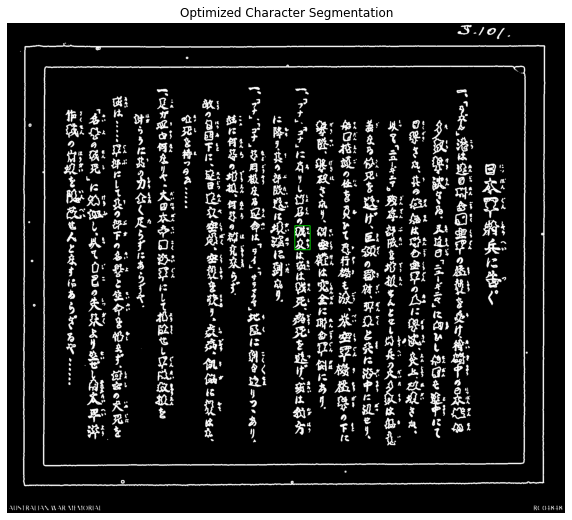

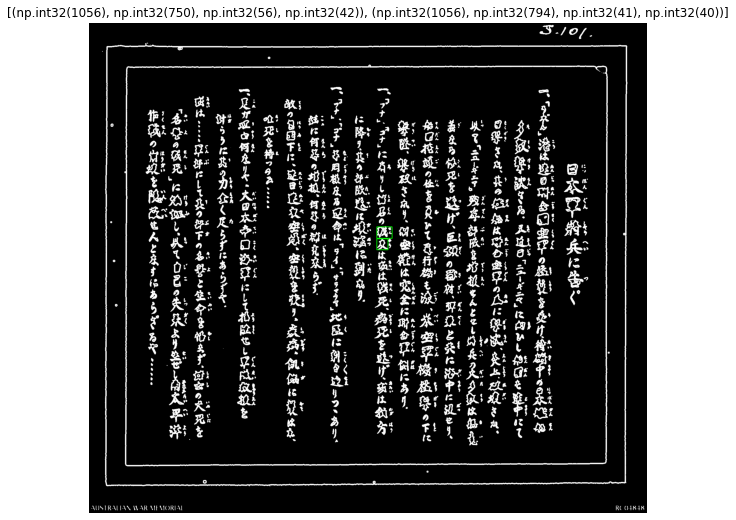

[(np.int32(1056), np.int32(750), np.int32(56), np.int32(42)), (np.int32(1056), np.int32(794), np.int32(41), np.int32(40))]


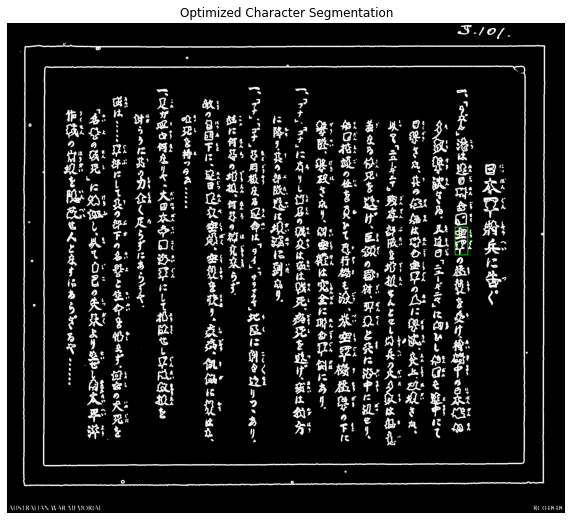

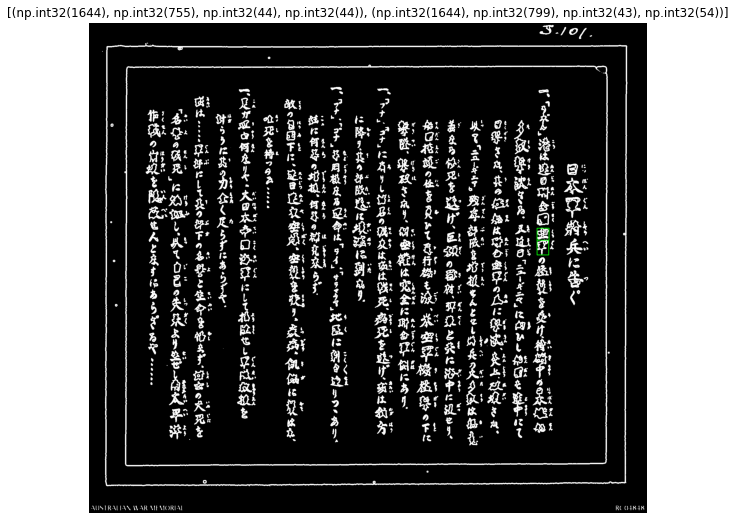

[(np.int32(1644), np.int32(755), np.int32(44), np.int32(44)), (np.int32(1644), np.int32(799), np.int32(43), np.int32(54))]
2173


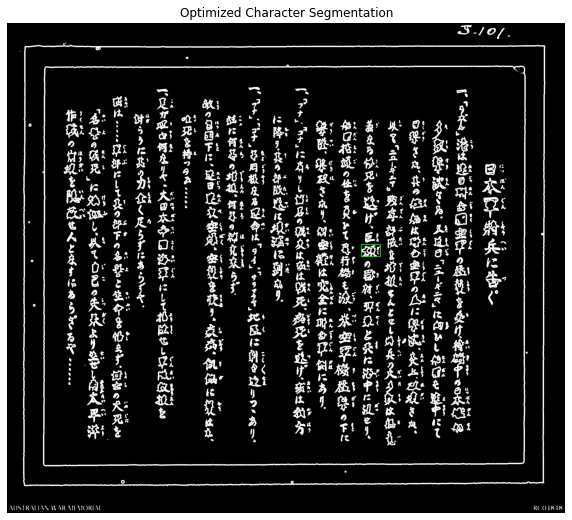

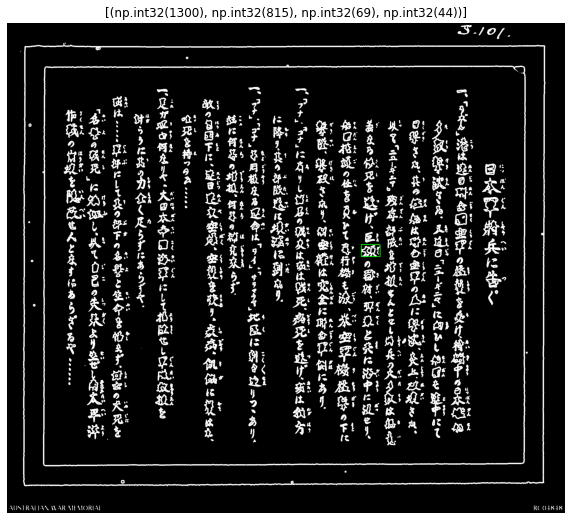

[(np.int32(1300), np.int32(815), np.int32(69), np.int32(44))]
2216


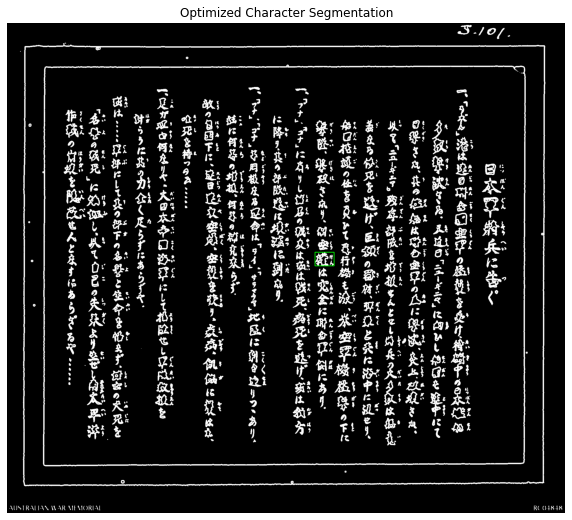

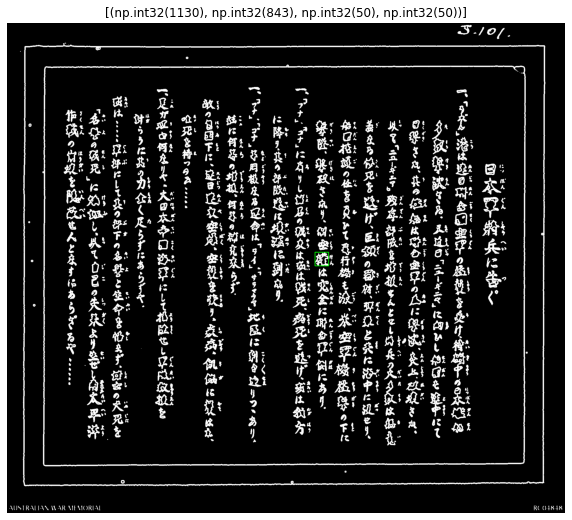

[(np.int32(1130), np.int32(843), np.int32(50), np.int32(50))]


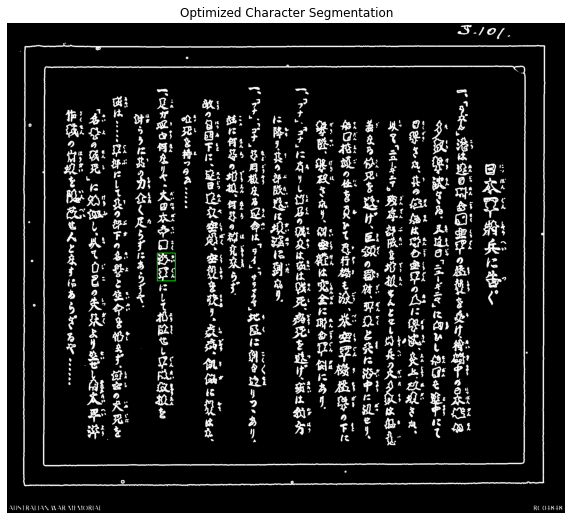

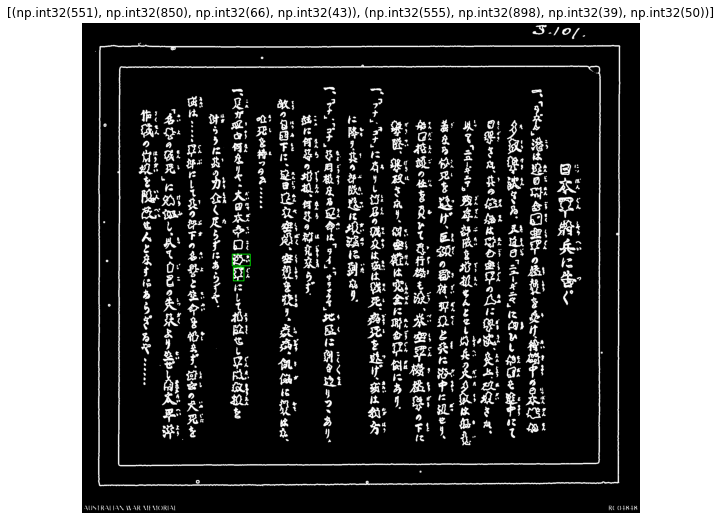

[(np.int32(551), np.int32(850), np.int32(66), np.int32(43)), (np.int32(555), np.int32(898), np.int32(39), np.int32(50))]


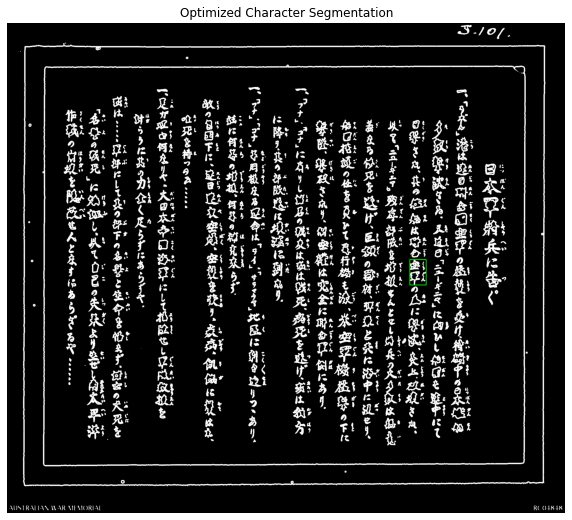

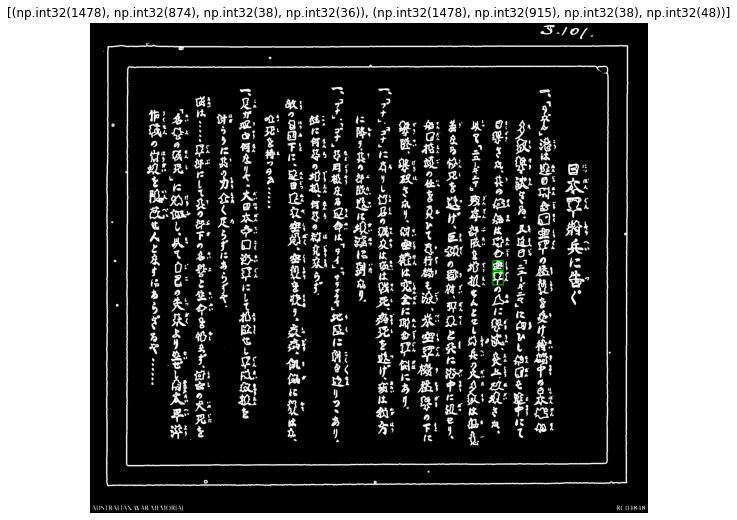

[(np.int32(1478), np.int32(874), np.int32(38), np.int32(36)), (np.int32(1478), np.int32(915), np.int32(38), np.int32(48))]


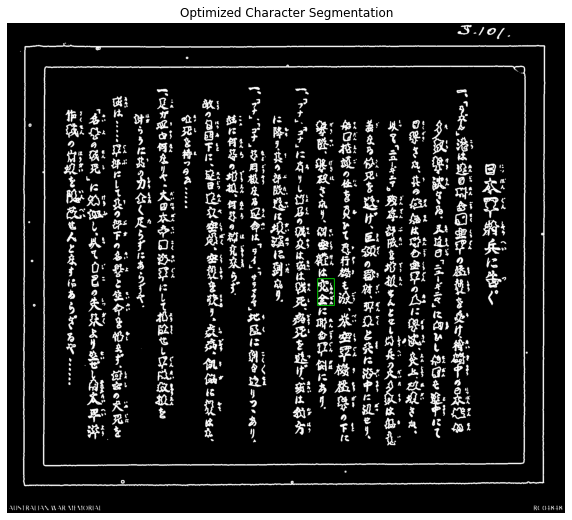

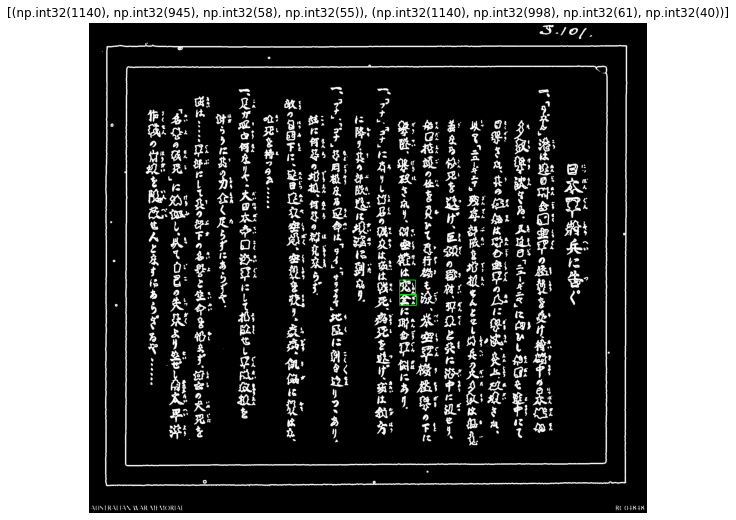

[(np.int32(1140), np.int32(945), np.int32(58), np.int32(55)), (np.int32(1140), np.int32(998), np.int32(61), np.int32(40))]


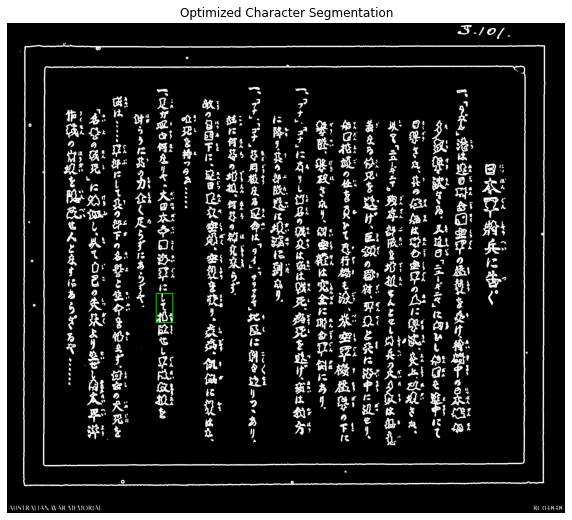

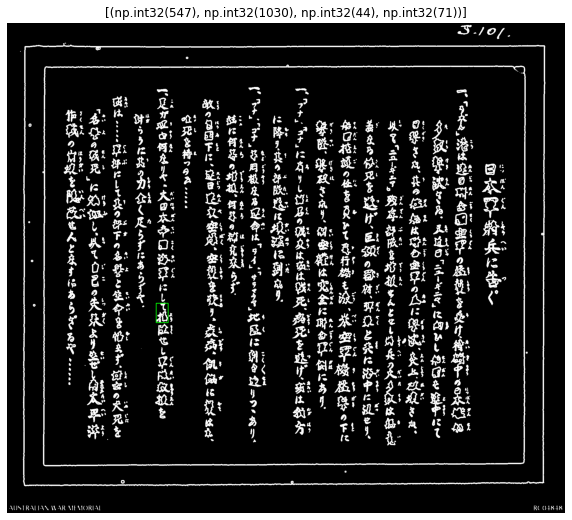

[(np.int32(547), np.int32(1030), np.int32(44), np.int32(71))]


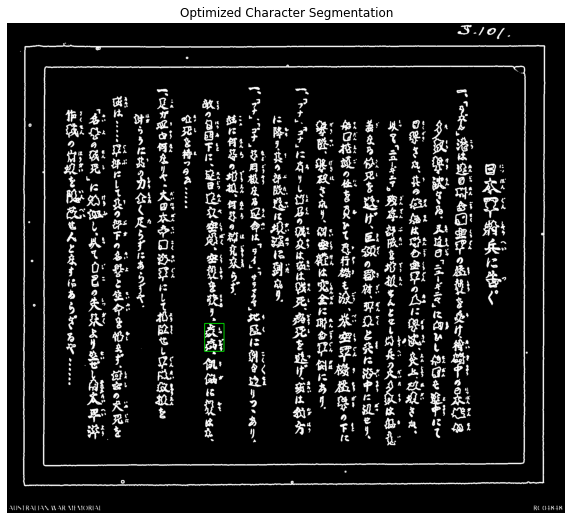

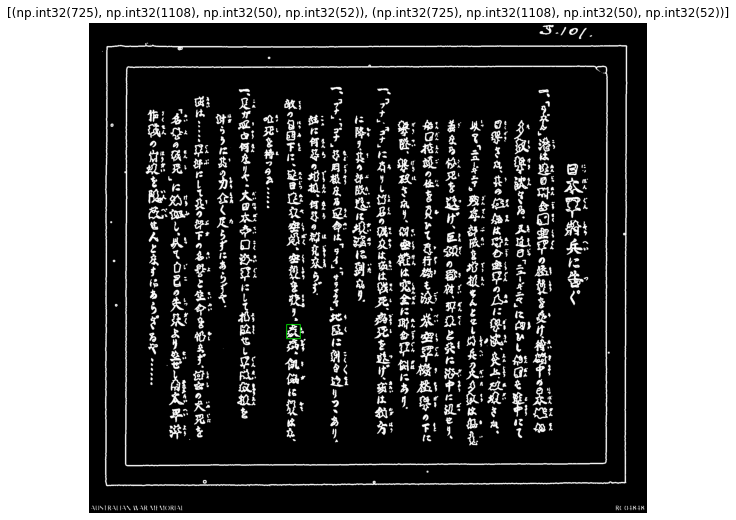

[(np.int32(725), np.int32(1108), np.int32(50), np.int32(52)), (np.int32(725), np.int32(1108), np.int32(50), np.int32(52))]
2484


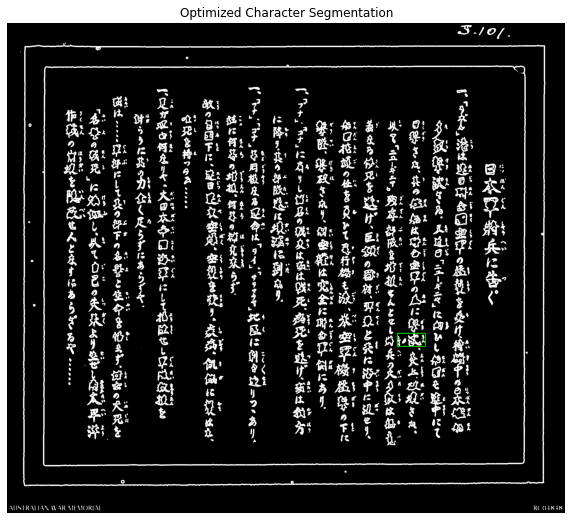

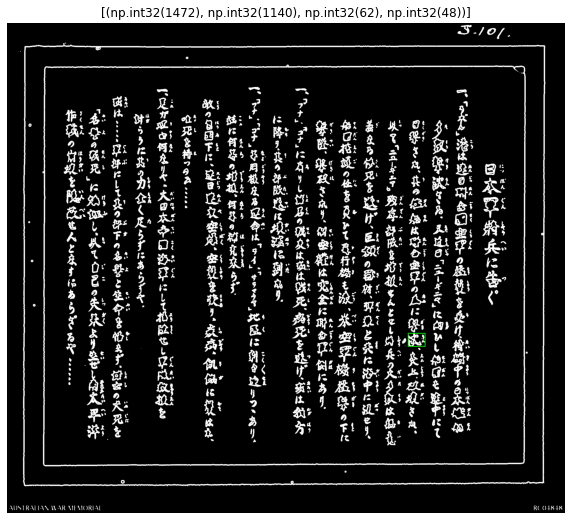

[(np.int32(1472), np.int32(1140), np.int32(62), np.int32(48))]


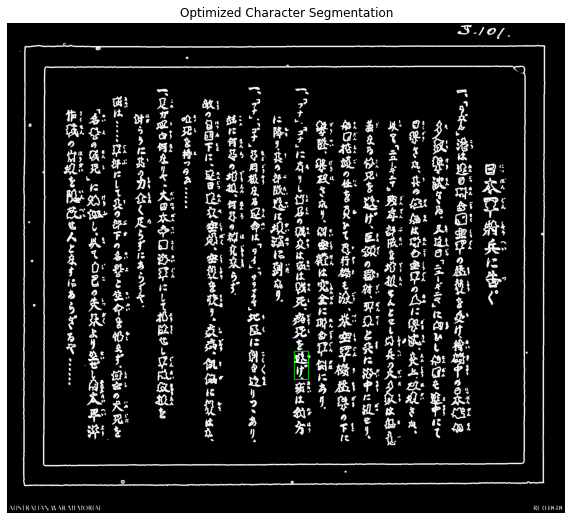

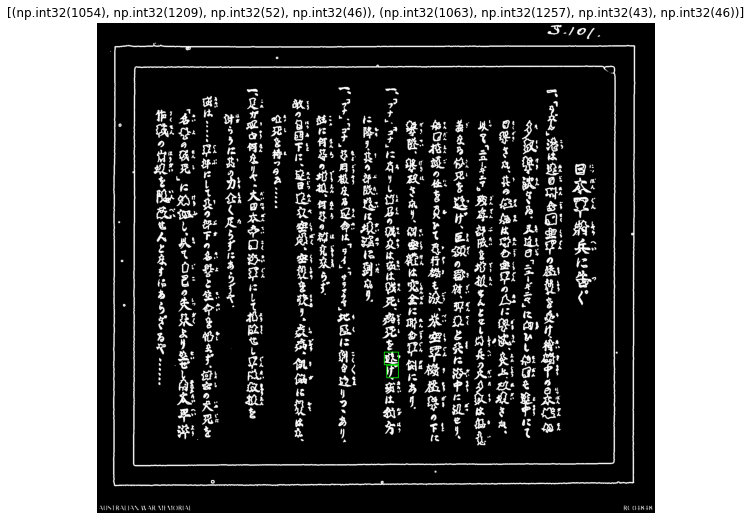

[(np.int32(1054), np.int32(1209), np.int32(52), np.int32(46)), (np.int32(1063), np.int32(1257), np.int32(43), np.int32(46))]


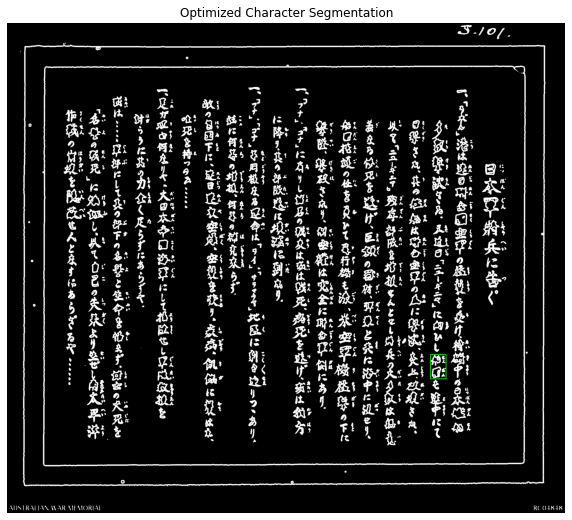

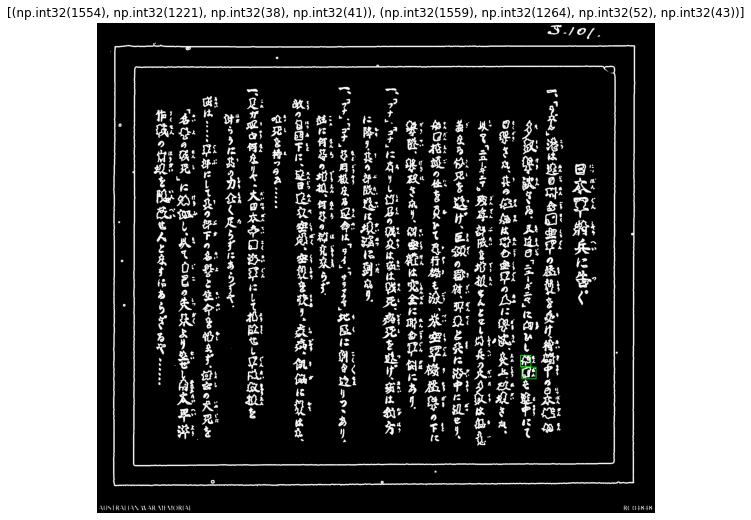

[(np.int32(1554), np.int32(1221), np.int32(38), np.int32(41)), (np.int32(1559), np.int32(1264), np.int32(52), np.int32(43))]


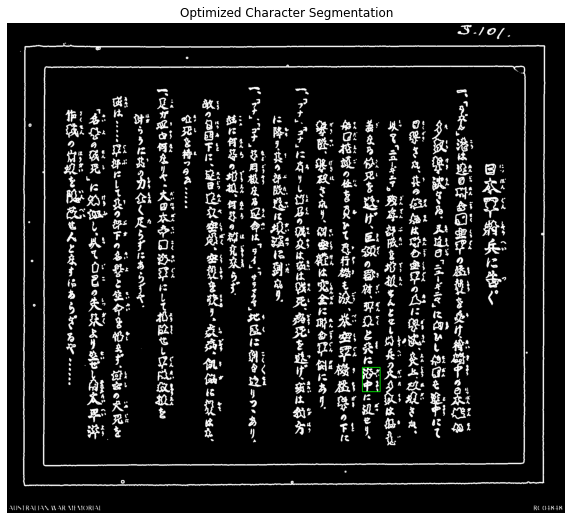

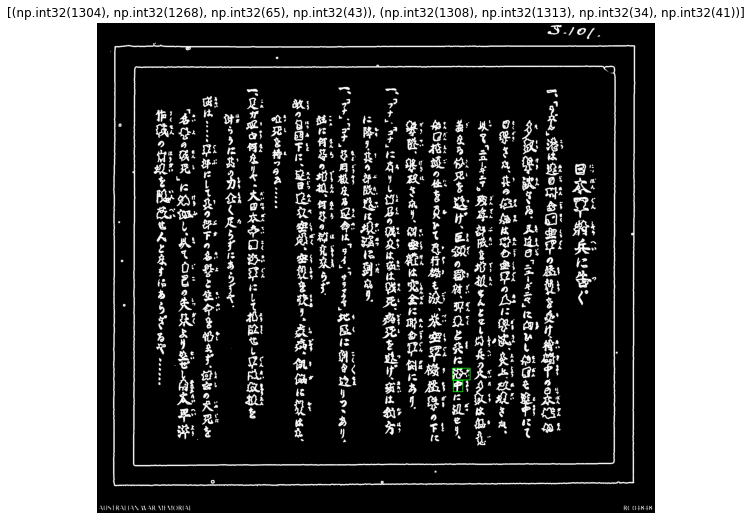

[(np.int32(1304), np.int32(1268), np.int32(65), np.int32(43)), (np.int32(1308), np.int32(1313), np.int32(34), np.int32(41))]


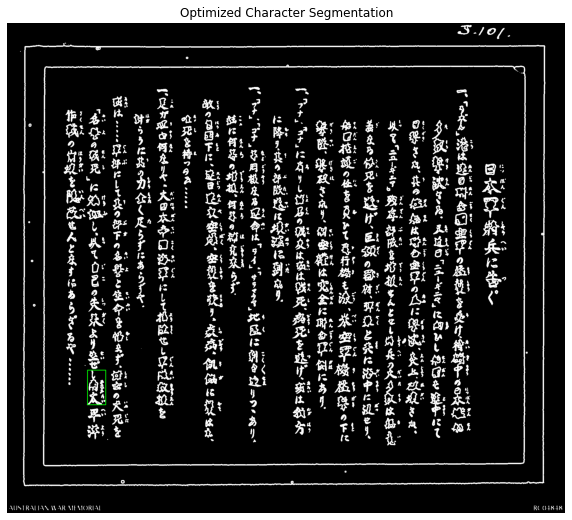

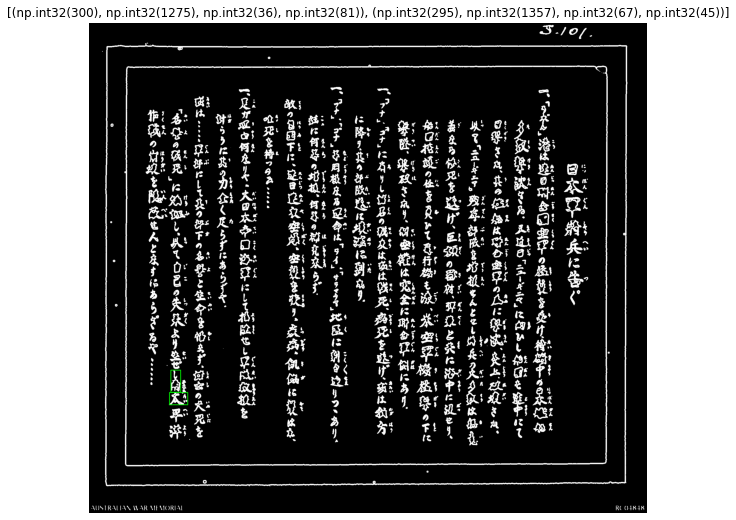

[(np.int32(300), np.int32(1275), np.int32(36), np.int32(81)), (np.int32(295), np.int32(1357), np.int32(67), np.int32(45))]


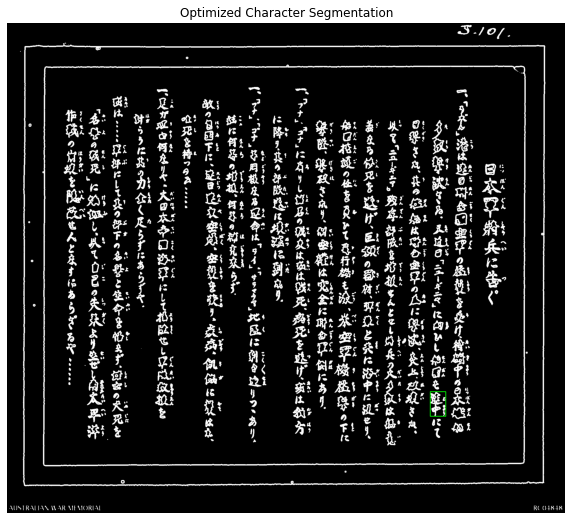

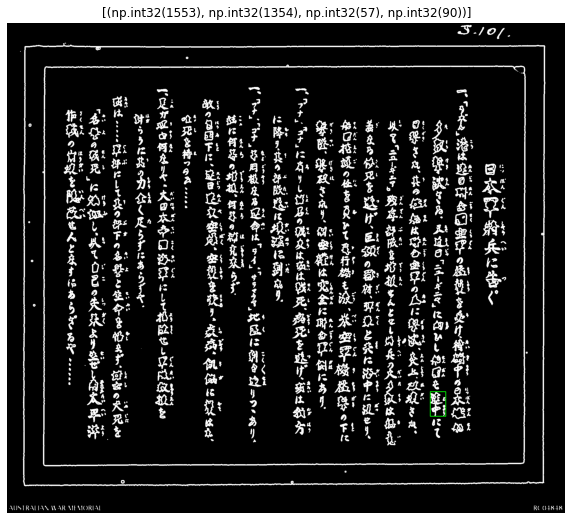

[(np.int32(1553), np.int32(1354), np.int32(57), np.int32(90))]


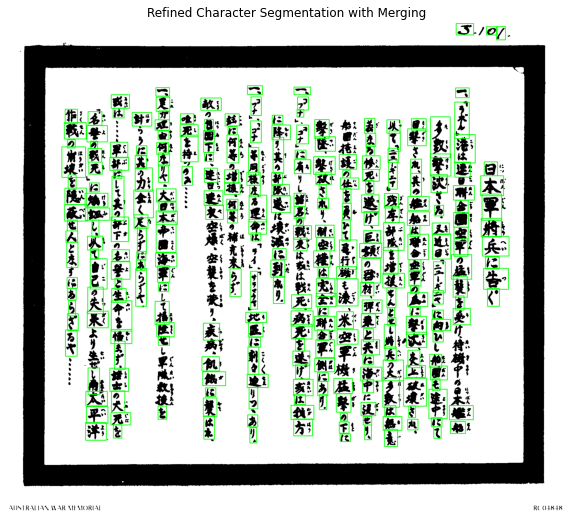

In [205]:
    
#image_path = r"C:\Users\xiong\Desktop\SCHOOL\ANU\CUR_2025s1\Project\japanese-handwriting-analysis\image_processing_jyx\output\RC04844\page_4.png" 
image_path = r"C:\Users\xiong\Desktop\SCHOOL\ANU\CUR_2025s1\Project\japanese-handwriting-analysis\image_processing_jyx\output\RC04848\page_2.png"
original_image, processed_image = load_and_preprocess_image(image_path)
#kernal = np.array([[0,0,0,0,0],[0,1,1,1,0],[1,1,1,1,1],[0,1,1,1,0],[0,0,0,0,0]])
character_boxes = detect_large_characters(processed_image,original_image)
output_image_segmented = draw_bounding_boxes(original_image, character_boxes)
display_image(output_image_segmented, title="Refined Character Segmentation with Merging")
